# MultiClass Dog-Breed Classification

## Problem

To Identify the breed of the dog given an image of a dog

## Data

I have collected the data from Kaggle (Dog breed Identification)
https://www.kaggle.com/competitions/dog-breed-identification/data

## Features of Data

1) We have data in the form of images(unstructured data)

2) There are 120 breeds of dogs

3) There are around 10000+ images in both training set and test set

4) Test set data is unlabelled and Images of training set data is labelled

## Workspace

In [2]:
import tensorflow as tf
import tensorflow_hub as hub
print("TF versin: ",tf.__version__)
print("TF hub version: ",hub.__version__)

print("GPU","available" if tf.config.list_physical_devices("GPU") else "not available")

TF versin:  2.13.0
TF hub version:  0.14.0
GPU available


## Converting Data into Tensors

In [3]:
import pandas as pd
labels_csv = pd.read_csv("/content/drive/MyDrive/Dog vision/labels.csv")
print(labels_csv.describe())

                                      id               breed
count                              10222               10222
unique                             10222                 120
top     000bec180eb18c7604dcecc8fe0dba07  scottish_deerhound
freq                                   1                 126


In [4]:
labels_csv.head()

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever


<Axes: >

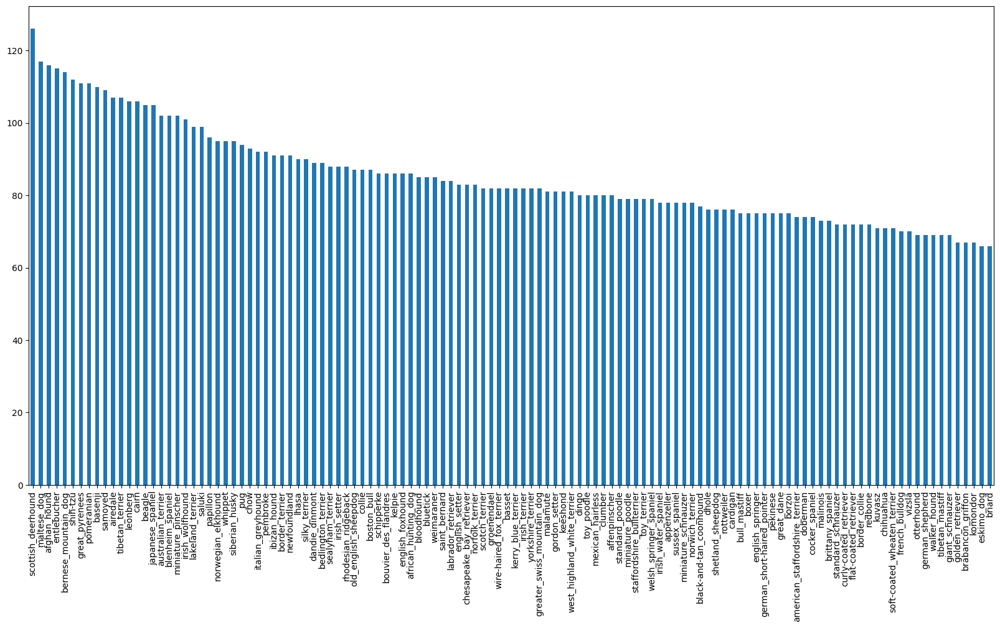

In [5]:
labels_csv["breed"].value_counts().plot(kind="bar",figsize=(20,10))

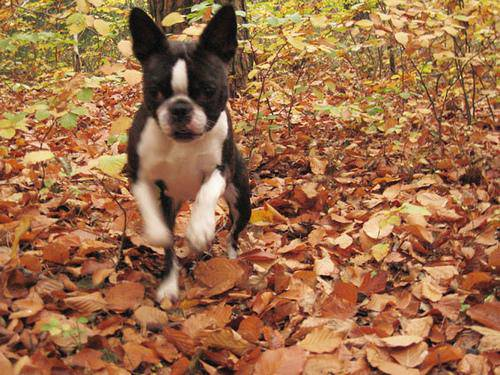

In [6]:
from IPython.display import Image
Image("drive/MyDrive/Dog vision/train/000bec180eb18c7604dcecc8fe0dba07.jpg")

In [7]:
filenames = ["drive/MyDrive/Dog vision/train/"+fname+".jpg" for fname in labels_csv["id"]]
print(len(filenames))

10222


In [8]:
import os
print(len(os.listdir("drive/MyDrive/Dog vision/train/")))
if len(os.listdir("drive/MyDrive/Dog vision/train/")) == len(filenames) :
  print("Filenames match")
else:
  print("Filenames dont match")

10222
Filenames match


In [9]:
import numpy as np
labels = labels_csv["breed"]
labels = np.array(labels)
labels

array(['boston_bull', 'dingo', 'pekinese', ..., 'airedale',
       'miniature_pinscher', 'chesapeake_bay_retriever'], dtype=object)

In [10]:
unique_breeds = np.unique(labels)
len(unique_breeds)

120

In [11]:
boolean_labels = [label==unique_breeds for label in labels]
boolean_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

### Validation Set

In [12]:
X = filenames
Y = boolean_labels

We will start by experimenting with 1000 images and then increase as required

In [13]:
NUM_IMAGES = 1000 #@param {type:"slider",min:1000,max:10000,step:1000}

In [14]:
from sklearn.model_selection import train_test_split

X_train,X_val,Y_train,Y_val = train_test_split(X[:NUM_IMAGES],Y[:NUM_IMAGES],test_size=0.2,random_state = 42)

len(X_train),len(Y_train),len(X_val),len(Y_val)

(800, 800, 200, 200)

### Preprocessing Images

In [15]:
IMG_SIZE = 224

def process_image(image_path):
  #Read in an image file
  image = tf.io.read_file(image_path)
  #Turn our image into Tensor with 3 color channels
  image = tf.image.decode_jpeg(image,channels = 3)
  #Normalization
  image = tf.image.convert_image_dtype(image,tf.float32)
  #Resize image(224,224)
  image = tf.image.resize(image,size=[IMG_SIZE,IMG_SIZE])

  return image

## Turning Our Data into Batches

In [16]:
#function that returns a tuple (image,label)
def get_image_label(image_path,label):
  image = process_image(image_path)
  return image,label

In [17]:
#function that turns data into batches
BATCH_SIZE = 32

def create_data_batches(X,Y=None,batch_size = BATCH_SIZE,valid_data = False, test_data = False):
  if test_data:
    print("Creating test data Batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X)))
    data_batch = data.map(process_image).batch(BATCH_SIZE)
    return data_batch

  elif valid_data:
    print("Creating valid data Batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch
  else:
    print("Creating traning data Batches...")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),tf.constant(Y)))
    #Shuffling pathnames & labels
    data = data.shuffle(buffer_size = len(X))
    data_batch = data.map(get_image_label).batch(BATCH_SIZE)
    return data_batch

In [18]:
train_data = create_data_batches(X_train,Y_train)
val_data = create_data_batches(X_val,Y_val,valid_data = True)

Creating traning data Batches...
Creating valid data Batches...


### Data Visualization

In [19]:
import matplotlib.pyplot as plt

def show_25_images(images,labels):

  plt.figure(figsize=(10,10))

  for i in range(25):
    #Create subplots
    ax = plt.subplot(5,5,i+1)
    plt.imshow(images[i])
    plt.title(unique_breeds[labels[i].argmax()])
    plt.axis("off")

In [20]:
train_images , train_labels = next(train_data.as_numpy_iterator())
len(train_images), len(train_labels)

(32, 32)

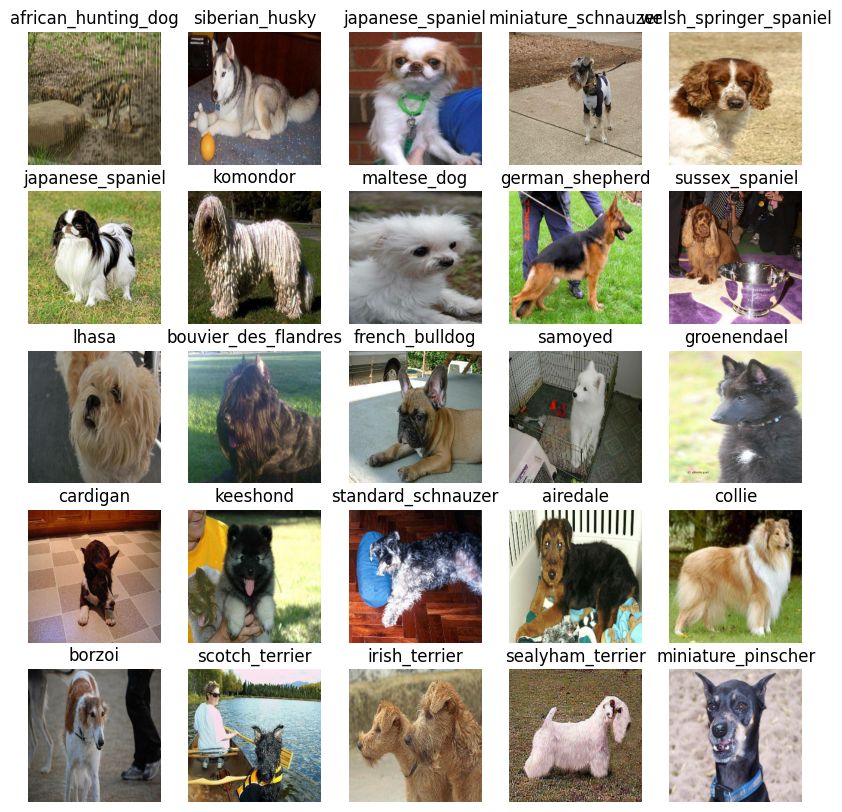

In [21]:
show_25_images(train_images,train_labels)

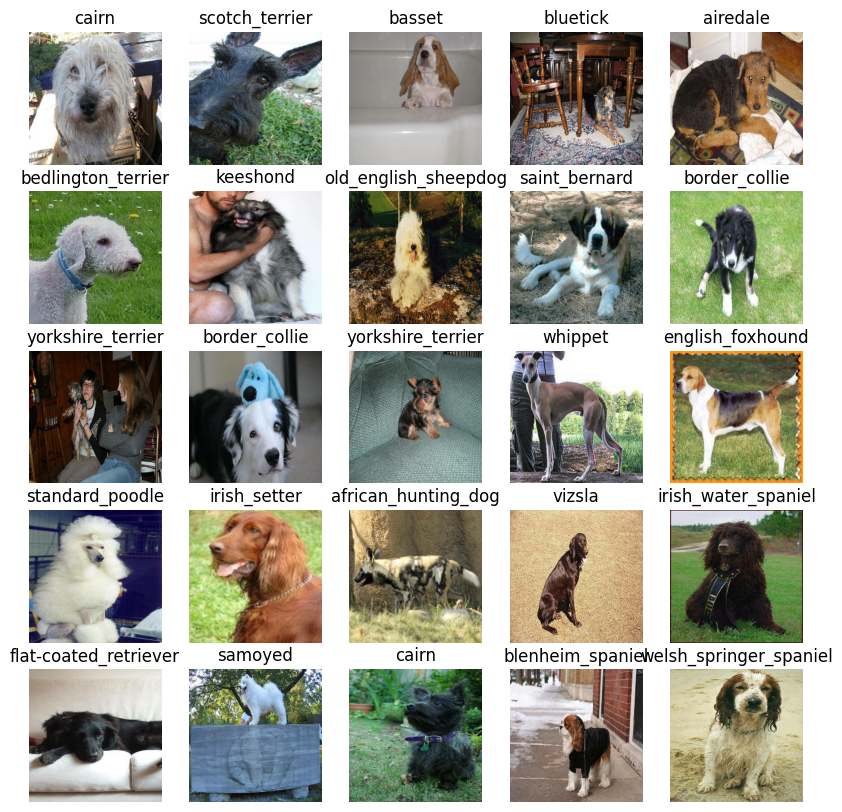

In [22]:
val_images,val_labels = next(val_data.as_numpy_iterator())
show_25_images(val_images,val_labels)

## Model

In [23]:
INPUT_SHAPE = [None, IMG_SIZE,IMG_SIZE,3] #batch,height,width,colour channels

OUTPUT_SHAPE = len(unique_breeds)

#Model choosen from Tensorflow Hub (Transfer learning)
MODEL_URL = "https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4"

In [24]:
#Keras deep learning model
def create_model(input_shape = INPUT_SHAPE,output_shape = OUTPUT_SHAPE,model_url = MODEL_URL):
  print("Building model with: ",model_url)
  model = tf.keras.Sequential([
      hub.KerasLayer(MODEL_URL), #Input Layer
      tf.keras.layers.Dense(units=OUTPUT_SHAPE,activation="softmax") #Output Layer
  ])

  #compile the model

  model.compile(
      loss = tf.keras.losses.CategoricalCrossentropy(),
      optimizer = tf.keras.optimizers.Adam(),
      metrics = ["accuracy"]
  )

  #Building the model
  model.build(INPUT_SHAPE)

  return model

In [25]:
model = create_model()
model.summary()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 keras_layer (KerasLayer)    (None, 1001)              5432713   
                                                                 
 dense (Dense)               (None, 120)               120240    
                                                                 
Total params: 5552953 (21.18 MB)
Trainable params: 120240 (469.69 KB)
Non-trainable params: 5432713 (20.72 MB)
_________________________________________________________________


### Creating callbacks

In [26]:
#Tensorboard Callback
%load_ext tensorboard

In [27]:
import datetime

#function to build tensorboard callback
def create_tensorboard_callback():
  logdir = os.path.join("drive/MyDrive/Dog vision/logs",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  return tf.keras.callbacks.TensorBoard(logdir)

In [28]:
#Early stopping callback
early_stopping = tf.keras.callbacks.EarlyStopping(monitor="val_accuracy",patience=3)

## Training our Model

In [29]:
EPOCHS = 100 #@param {type:"slider",min:10,max:100,step:10}

In [30]:
def train_model():
  model = create_model()
  tensorboard = create_tensorboard_callback()
  model.fit(x=train_data,epochs=EPOCHS,validation_data=val_data,validation_freq=1,callbacks=[tensorboard,early_stopping])
  return model

In [31]:
model = train_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4
Epoch 1/100
25/25 [==============================] - 101s 4s/step - loss: 4.6376 - accuracy: 0.1100 - val_loss: 3.4569 - val_accuracy: 0.2650
Epoch 2/100
25/25 [==============================] - 3s 109ms/step - loss: 1.6675 - accuracy: 0.6875 - val_loss: 2.2129 - val_accuracy: 0.4900
Epoch 3/100
25/25 [==============================] - 3s 106ms/step - loss: 0.5887 - accuracy: 0.9325 - val_loss: 1.6820 - val_accuracy: 0.6100
Epoch 4/100
25/25 [==============================] - 3s 140ms/step - loss: 0.2563 - accuracy: 0.9875 - val_loss: 1.5002 - val_accuracy: 0.6300
Epoch 5/100
25/25 [==============================] - 3s 117ms/step - loss: 0.1517 - accuracy: 0.9975 - val_loss: 1.4056 - val_accuracy: 0.6400
Epoch 6/100
25/25 [==============================] - 3s 105ms/step - loss: 0.1027 - accuracy: 0.9975 - val_loss: 1.3576 - val_accuracy: 0.6600
Epoch 7/100
25/25 [==============================

We need to avoid overfitting over training dataset

In [32]:
%tensorboard --logdir drive/My\ Drive/Dog\ vision/logs

<IPython.core.display.Javascript object>

## Evaluating Predictions

In [33]:
predictions = model.predict(val_data,verbose=1)
predictions

7/7 [==============================] - 20s 84ms/step


array([[3.1450426e-04, 7.3260402e-05, 7.1149431e-03, ..., 2.1638632e-04,
        9.6560016e-06, 2.3021884e-03],
       [4.9892277e-03, 4.8073800e-04, 1.9463417e-03, ..., 3.5912369e-04,
        3.7441661e-03, 3.6814614e-04],
       [2.0998101e-05, 1.3884451e-04, 4.9044269e-05, ..., 5.2416988e-05,
        1.6269336e-05, 4.1330819e-05],
       ...,
       [5.0193421e-06, 8.7783948e-05, 1.9952049e-04, ..., 8.9529713e-06,
        9.0574147e-05, 3.1759995e-05],
       [1.9510203e-03, 3.2394097e-04, 9.9657540e-05, ..., 3.3386031e-04,
        2.5105721e-05, 1.1011179e-02],
       [2.2007451e-04, 3.9034986e-04, 6.9384943e-03, ..., 3.7213795e-02,
        5.5978476e-04, 2.0629006e-04]], dtype=float32)

In [34]:
predictions.shape

(200, 120)

In [35]:
def get_pred_label(prediction_probabilities):
  return unique_breeds[np.argmax(prediction_probabilities)]

In [36]:
def unbatchify(data):
  #unbatch the validation dataset
  images_ = []
  labels_ = []

  for image,label in data.unbatch().as_numpy_iterator():
    images_.append(image)
    labels_.append(get_pred_label(label))
  return images_,labels_

In [37]:
val_images,val_labels = unbatchify(val_data)

### Visualizing Predictions

In [38]:
def plot_pred(prediction_probabilities,labels,images,n=1):

  pred_prob,true_label,image = prediction_probabilities[n],labels[n],images[n]

  pred_label = get_pred_label(pred_prob)

  plt.imshow(image)
  plt.xticks([])
  plt.yticks([])

  if pred_label == true_label:
    color = "green"
  else:
    color = "red"

  plt.title("{} {:2.0f}% {}".format(pred_label,np.max(pred_prob)*100,true_label),color=color)

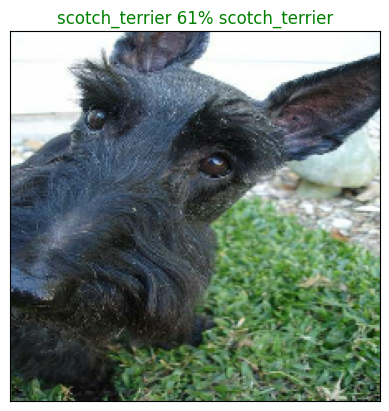

In [39]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=1)

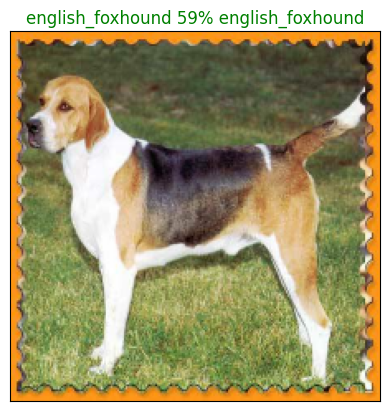

In [40]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=14)

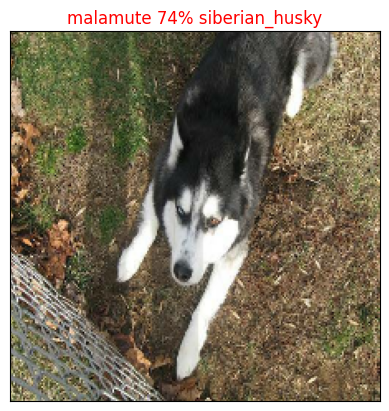

In [41]:
plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=35)

### Our best 5 predictions

In [42]:
def plot_pred_conf(prediction_probabilities,labels,n=1):

  pred_prob,true_label = prediction_probabilities[n],labels[n]

  pred_label = get_pred_label(pred_prob)

  top_5_pred_indexes = pred_prob.argsort()[-5:][::-1]

  top_5_pred_values = pred_prob[top_5_pred_indexes]

  top_5_pred_labels = unique_breeds[top_5_pred_indexes]

  top_plot = plt.bar(np.arange(len(top_5_pred_labels)),top_5_pred_values,color="red")

  plt.xticks(np.arange(len(top_5_pred_labels)),labels = top_5_pred_labels,rotation="vertical")

  if np.isin(true_label,top_5_pred_labels):
    top_plot[np.argmax(top_5_pred_labels==true_label)].set_color("green")
  else:
    pass

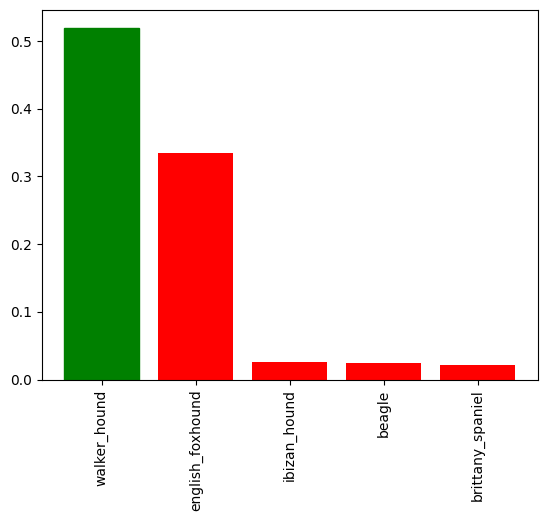

In [43]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=32)

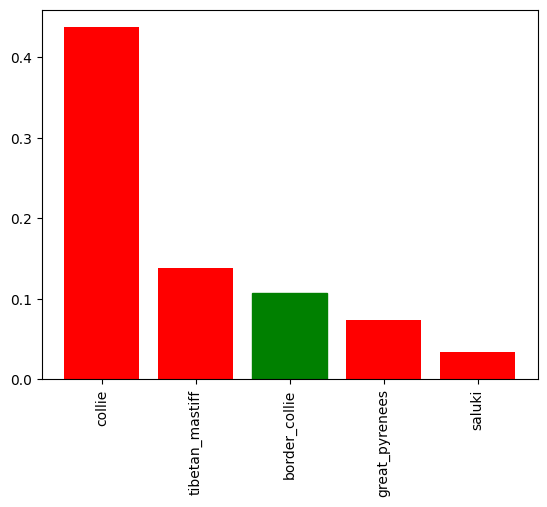

In [44]:
plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=9)

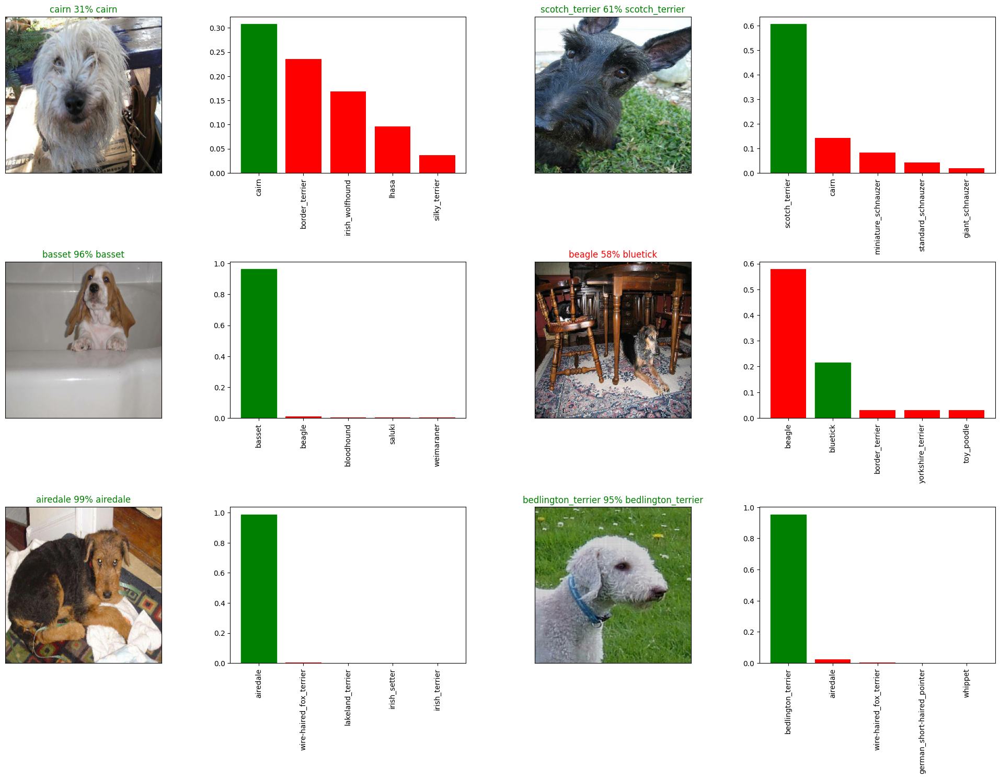

In [45]:
num_rows = 3
num_cols = 2
num_images = num_rows*num_cols
plt.figure(figsize=(10*num_cols,5*num_rows))
for i in range(num_images):
  plt.subplot(num_rows,2*num_cols,2*i+1)
  plot_pred(prediction_probabilities=predictions,labels=val_labels,images=val_images,n=i)
  plt.subplot(num_rows,2*num_cols,2*i+2)
  plot_pred_conf(prediction_probabilities=predictions,labels=val_labels,n=i)
plt.tight_layout(h_pad=1.0)
plt.show()

## Saving Model

In [46]:
def save_model(model,suffix=None):
  modeldir = os.path.join("drive/My Drive/Dog vision/models",datetime.datetime.now().strftime("%Y%m%d-%H%M%S"))
  model_path = modeldir + "-" + suffix + ".h5"
  print(f"Saving Model to:{model_path}...")
  model.save(model_path)
  return model_path

## Load the Model

In [47]:
def load_model(model_path):
  model = tf.keras.models.load_model(model_path,custom_objects={"KerasLayer":hub.KerasLayer})
  return model

In [48]:
save_model(model,suffix="1000-images-mobilenetv2-Adam")

Saving Model to:drive/My Drive/Dog vision/models/20231005-041815-1000-images-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog vision/models/20231005-041815-1000-images-mobilenetv2-Adam.h5'

In [49]:
loaded_model = load_model("drive/My Drive/Dog vision/models/20231004-054916-1000-images-mobilenetv2-Adam.h5")

## Evaluating pre-saved Model

In [50]:
model.evaluate(val_data)

7/7 [==============================] - 1s 69ms/step - loss: 1.2404 - accuracy: 0.6750


[1.240373969078064, 0.675000011920929]

In [51]:
loaded_model.evaluate(val_data)

7/7 [==============================] - 2s 124ms/step - loss: 1.3150 - accuracy: 0.6550


[1.3149769306182861, 0.6549999713897705]

## Training Model on entire Data

In [52]:
len(X),len(Y)

(10222, 10222)

In [53]:
data0 = create_data_batches(X,Y)

Creating traning data Batches...


In [54]:
model0 = create_model()

Building model with:  https://tfhub.dev/google/imagenet/mobilenet_v2_130_224/classification/4


In [55]:
callbacks0 = create_tensorboard_callback()
callbacks1 = tf.keras.callbacks.EarlyStopping(monitor="accuracy",patience=3)


In [56]:
model0.fit(x=data0,epochs=EPOCHS,callbacks=[callbacks0,callbacks1])

Epoch 1/100
320/320 [==============================] - 967s 3s/step - loss: 1.3418 - accuracy: 0.6678
Epoch 2/100
320/320 [==============================] - 30s 94ms/step - loss: 0.3976 - accuracy: 0.8815
Epoch 3/100
320/320 [==============================] - 29s 90ms/step - loss: 0.2381 - accuracy: 0.9339
Epoch 4/100
320/320 [==============================] - 29s 90ms/step - loss: 0.1509 - accuracy: 0.9658
Epoch 5/100
320/320 [==============================] - 28s 89ms/step - loss: 0.1067 - accuracy: 0.9780
Epoch 6/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0777 - accuracy: 0.9866
Epoch 7/100
320/320 [==============================] - 29s 90ms/step - loss: 0.0586 - accuracy: 0.9911
Epoch 8/100
320/320 [==============================] - 31s 96ms/step - loss: 0.0450 - accuracy: 0.9954
Epoch 9/100
320/320 [==============================] - 28s 89ms/step - loss: 0.0379 - accuracy: 0.9957
Epoch 10/100
320/320 [==============================] - 29s 89ms/step - lo

In [57]:
save_model(model0,suffix="full-image-set-mobilenetv2-Adam")

Saving Model to:drive/My Drive/Dog vision/models/20231005-051027-full-image-set-mobilenetv2-Adam.h5...


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


'drive/My Drive/Dog vision/models/20231005-051027-full-image-set-mobilenetv2-Adam.h5'

In [58]:
#Load the full model
loaded_full_model = load_model('drive/My Drive/Dog vision/models/20231005-051027-full-image-set-mobilenetv2-Adam.h5')

## Test Dataset

In [67]:
test_path = "drive/MyDrive/Dog vision/test/"
test_filenames = [test_path+fname for fname in os.listdir(test_path)]
len(test_filenames)

10357

In [68]:
test_data = create_data_batches(test_filenames,test_data = True)
test_data

Creating test data Batches...


<_BatchDataset element_spec=TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None)>

In [69]:
test_predictions = loaded_full_model.predict(test_data,verbose=1)

324/324 [==============================] - 156s 472ms/step


In [70]:
np.savetxt("drive/MyDrive/Dog vision/test_preds.csv",test_predictions,delimiter=",")

In [72]:
test_preds_ = np.loadtxt("drive/MyDrive/Dog vision/test_preds.csv",delimiter=",")
test_preds_[:10]

array([[1.40986618e-08, 9.70792779e-10, 1.71944084e-10, ...,
        2.30967315e-10, 2.17220020e-07, 8.98528844e-04],
       [1.09170424e-13, 5.29596714e-11, 1.13462137e-13, ...,
        2.44165506e-08, 3.16013051e-14, 9.52484229e-15],
       [2.71005018e-09, 3.00637309e-13, 2.17020485e-10, ...,
        6.75953260e-12, 2.44331257e-08, 3.22266409e-08],
       ...,
       [1.19131080e-10, 2.70211659e-10, 6.02914524e-11, ...,
        9.02260027e-08, 4.05442402e-10, 2.90718454e-08],
       [1.34449461e-12, 1.49548178e-08, 1.01123310e-09, ...,
        1.23485194e-07, 1.99148031e-09, 1.16072601e-06],
       [5.30991109e-08, 1.34964765e-07, 1.21397007e-11, ...,
        7.91304088e-12, 1.47698032e-08, 1.19966913e-07]])

In [74]:
test_preds_.shape

(10357, 120)

## Kaggle Submission

In [78]:
preds_df = pd.DataFrame(columns=["id"]+list(unique_breeds))
test_ids = [os.path.splitext(path)[0] for path in os.listdir(test_path)]
test_ids[:5]

['e7ed96b272013c6de9505a753816ce75',
 'e0f2620cb1ebf648b986c8a09dbd3664',
 'e25f28a6c07bf3909c4310b2685f6caf',
 'e504cbd0094fc72312087587795be597',
 'e1c6c50bbaee219e7faf29e9c1c343ca']

In [79]:
preds_df["id"] = test_ids
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7ed96b272013c6de9505a753816ce75,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,e0f2620cb1ebf648b986c8a09dbd3664,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,e25f28a6c07bf3909c4310b2685f6caf,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,e504cbd0094fc72312087587795be597,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,e1c6c50bbaee219e7faf29e9c1c343ca,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [80]:
preds_df[list(unique_breeds)] = test_preds_
preds_df.head()

,id,affenpinscher,afghan_hound,african_hunting_dog,airedale,american_staffordshire_terrier,appenzeller,australian_terrier,basenji,basset,...,toy_poodle,toy_terrier,vizsla,walker_hound,weimaraner,welsh_springer_spaniel,west_highland_white_terrier,whippet,wire-haired_fox_terrier,yorkshire_terrier
0,e7ed96b272013c6de9505a753816ce75,1.409866e-08,9.707928e-10,1.719441e-10,9.049776e-08,2.419393e-08,9.716365e-12,9.954790e-01,4.896611e-08,1.421894e-09,...,1.151332e-07,1.073228e-06,2.357571e-08,4.319015e-10,2.717995e-10,1.748672e-09,4.728953e-08,2.309673e-10,2.172200e-07,8.985288e-04
1,e0f2620cb1ebf648b986c8a09dbd3664,1.091704e-13,5.295967e-11,1.134621e-13,1.584578e-12,6.302209e-10,3.292579e-10,2.337816e-15,6.886455e-12,6.662634e-13,...,4.409582e-13,1.897034e-12,5.884038e-10,8.610200e-11,3.440429e-08,7.587087e-16,1.311308e-12,2.441655e-08,3.160131e-14,9.524842e-15
2,e25f28a6c07bf3909c4310b2685f6caf,2.710050e-09,3.006373e-13,2.170205e-10,3.491016e-12,2.903177e-12,1.858468e-09,1.751620e-09,2.438036e-10,2.688448e-12,...,9.504261e-11,1.971354e-08,3.898620e-12,1.460400e-11,1.187996e-12,7.953856e-11,1.212076e-09,6.759533e-12,2.443313e-08,3.222664e-08
3,e504cbd0094fc72312087587795be597,1.564652e-06,4.350888e-08,1.580814e-08,1.127815e-11,1.759528e-07,4.459438e-12,3.278885e-07,1.946550e-08,7.920340e-08,...,1.410045e-03,1.983287e-07,1.146095e-09,6.115149e-06,2.895011e-07,1.376794e-10,6.643784e-03,1.953154e-07,1.797063e-09,5.701916e-07
4,e1c6c50bbaee219e7faf29e9c1c343ca,9.987615e-01,6.891604e-08,2.613761e-09,4.329452e-12,1.102068e-14,4.720253e-13,1.470467e-08,3.784173e-13,5.160531e-11,...,7.448123e-07,3.194529e-13,2.461412e-10,2.253678e-11,3.696000e-12,2.740275e-13,2.717981e-12,7.021361e-13,4.891224e-12,1.626104e-05


In [82]:
preds_df.to_csv("drive/MyDrive/Dog vision/kagglesub.csv",index=False)